$$\text{\Huge{Hotdog or No Hotdog}}$$
**Dataset:** [Kaggle](https://www.kaggle.com/datasets/thedatasith/hotdog-nothotdog)

$$\text{\Huge{Setup}}$$

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import scienceplots
import seaborn as sns
import shutil
import sklearn as sk
import tensorflow as tf
import warnings

from io import BytesIO
from IPython.display import display, HTML
from keras_tuner.tuners import BayesianOptimization
from keras_tuner.engine.hyperparameters import HyperParameters
from matplotlib.axes import Axes
from matplotlib.projections import register_projection
from pathlib import Path
from PIL import Image, ImageOps
from random import sample
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    f1_score,
    mean_absolute_error,
    mean_squared_error,
    precision_score,
    r2_score,
    recall_score
)
from sklearn.model_selection import (
    cross_val_score,
    GridSearchCV,
    RepeatedStratifiedKFold,
    train_test_split
)
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from tensorflow import keras
from tensorflow.keras import layers, Input, Model
from tensorflow.keras.applications.resnet_v2 import preprocess_input
from tensorflow.keras.applications import ResNet152V2
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.datasets import mnist
from tensorflow.keras.layers import (
    Activation,
    BatchNormalization,
    Conv2D,
    Dense,
    Dropout,
    Flatten,
    MaxPooling2D,
    SeparableConv2D,
    SpatialDropout2D,
    RandomFlip,
    RandomRotation,
    RandomZoom,
    Rescaling
)
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.models import load_model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.regularizers import L1, L1L2, L2
from tensorflow.keras.utils import image_dataset_from_directory, plot_model
from zipfile import ZipFile

In [2]:
plt.style.use('science')

plt.rcParams['axes.titlesize'] = 24
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['xtick.labelsize'] = 14
plt.rcParams['ytick.labelsize'] = 14
plt.rcParams['axes.titlepad'] = 15 
plt.rcParams['axes.labelpad'] = 15
plt.rcParams['legend.title_fontsize'] = 16
plt.rcParams['legend.fontsize'] = 12

In [3]:
def grid(images):
    length = len(images)
    
    if length % 2 == 0:
        row = column = int(length / 2)
    else:
        row = column = int(length / 2) + 1
    
    width = height = 300

    size = (
        (column * width), 
        (2 * height)
    )
    
    grid = Image.new(
        'RGBA',
        color=(255, 0, 0, 0),
        size=size
    )

    for index, image in enumerate(images, 0):
        box = (
            int(index % column * width),
            int(index // column * height) 
        )
        
        grid.paste(
            image, 
            box=box
        )
        
    return grid

In [4]:
def get_unique_size(images):
    return set(
        Image.open(image).size 
        for image in images
    )

In [5]:
def get_sample(dataset):
    labels = dataset.class_names

    legend = {
        index: label.replace('_', ' ').title()
        for (index, label) in enumerate(labels, 0)
    }

    figsize = (10, 10)
    plt.figure(figsize=figsize)
    
    for images, labels in dataset.take(1):
        for i, j in enumerate(range(9), 1): 
            ax = plt.subplot(3, 3, i)
            plt.subplots_adjust(hspace=0.5)

            img = images[j].numpy().astype('uint8')
            lbl = int(labels[j])

            lbl = legend.get(lbl)

            plt.imshow(img)
            plt.title(lbl)

            plt.axis('off')

In [6]:
def get_activation(inputs):
    outputs = layer.output

    model_activation = Model(
        inputs=inputs,
        outputs=outputs
    )

    activation, *_ = model_activation.predict(array)

    cm = plt.get_cmap('viridis')

    images = [
        Image.fromarray(
            np.uint8(
                cm(activation[:, :, i]) * 255
            )
        ).resize(
            (300, 300),
            Image.Resampling.LANCZOS
        )
        for i in range(0, 16)
    ]

    image = grid(images)
    return image

In [7]:
def get_image_folder(path: Path, folder: str) -> tuple[Path, int]:        
    images = [
        image
        for image in path.joinpath(folder).iterdir()
        if image.is_file() and image.suffix.lower() in extension
    ]
    
    length = len(images)
    return (images, length)

In [8]:
def display_deep_score(loss: float, accuracy: float) -> pd.DataFrame:        
        score = {}

        score['Loss'] = loss
        score['Accuracy'] = accuracy

        data = score.items()
        columns = ['Metric', 'Score']

        return pd.DataFrame(data=data, columns=columns)

**What question are you going to address?</font>**

- Is it possible to create a model to predict if an image is a hotdog or not using a neural network model?
- Is there a difference in scoring between a dense model and a convolutional neural network?
- Are we able to boost the model's predictive ability by utilizing a pretrained model?

**Define the problem as a supervised learning task, and how you will solve it using machine learning.**

- We are using supervised learning and binary classification, because we are predicting whether an image is a hotdog or not.
- We will be using a dense model and a convolutional neural network model to make our predictions.

$$\text{\Huge{Data understanding}}$$

Store each path as its own variable

In [9]:
cwd = Path.cwd()

dataset = cwd.joinpath('dataset')
dataset.mkdir(parents=True, exist_ok=True)

train = dataset.joinpath('train')
test = dataset.joinpath('test')

Our initial project structure after extracting the .zip file:

```
project
└────hotdog
│    └────hotdog-nothotdog
│         └────test
│              └────hotdog
│                   │    *.jpg
│              └────nothotdog
│                   │    *.jpg
│         └────train
│              └────hotdog
│                   │    *.jpg
│              └────nothotdog
│                   │    *.jpg


```

Extract the .zip file and reorganize the image dataset structure

In [10]:
is_dataset_empty = not any(
    dataset.iterdir()
)

# Extract the .zip file if the base folder doesn't exist or is empty
if not dataset.is_dir() or is_dataset_empty:
    archive = cwd.joinpath('hotdog.zip')

    file = ZipFile(archive, 'r')
    file.extractall(dataset)
    file.close()

    # Delete the .zip file
    # archive.unlink(missing_ok=True)

    for directory in dataset.iterdir():
        print(directory)
    
        for subdirectory in directory.iterdir():
            shutil.move(
                subdirectory.as_posix(),
                dataset.as_posix()
            )

        # Delete the parent directory
        shutil.rmtree(directory)

Rename directory

In [11]:
if train.joinpath('nothotdog').exists() or test.joinpath('nothotdog').exists():
    name = 'not_hotdog'

    train.joinpath('nothotdog').rename(
        train.joinpath(name)
    )

    test.joinpath('nothotdog').rename(
        test.joinpath(name)
    )

Create a validation dataset

In [12]:
validation = dataset.joinpath('validation')
validation.joinpath('hotdog').mkdir(parents=True, exist_ok=True)
validation.joinpath('not_hotdog').mkdir(parents=True, exist_ok=True)

In [13]:
extension = set(
    image.suffix
    for directory in dataset.iterdir()
    for image in directory.glob('**/*')
    if image.is_file()
)

print(extension)

{'.jpg'}


Store each folder as its own variable and count the images present in each folder

In [14]:
train_hotdog, length = get_image_folder(train, 'hotdog')
train_not_hotdog, length = get_image_folder(train, 'not_hotdog')

print(f"Train (Hotdog): {length}")
print(f"Train (Not Hotdog): {length}")

Train (Hotdog): 1821
Train (Not Hotdog): 1821


In [15]:
test_hotdog, length = get_image_folder(test, 'hotdog')
test_not_hotdog, length = get_image_folder(test, 'not_hotdog')

print(f"Test (Hotdog): {length}")
print(f"Test (Not Hotdog): {length}")

Test (Hotdog): 200
Test (Not Hotdog): 200


In [16]:
validation_hotdog, length = get_image_folder(validation, 'hotdog')
validation_not_hotdog, length = get_image_folder(validation, 'not_hotdog')

print(f"Validation (Hotdog): {length}")
print(f"Validation (Not Hotdog): {length}")

Validation (Hotdog): 300
Validation (Not Hotdog): 300


We randomly sample images from our training dataset and move them into our validation dataset.

In [17]:
vh = validation.joinpath('hotdog')
vnh = validation.joinpath('not_hotdog')

is_validation_empty = not any(
    vh.iterdir() or
    vnh.iterdir()
)

if is_validation_empty:
    selection = sample(train_hotdog, 300)

    for path in selection:
        shutil.move(
            path.as_posix(),
            vh.as_posix()
        )

    selection = sample(train_not_hotdog, 300)

    for path in selection:
        shutil.move(
            path.as_posix(),
            vnh.as_posix()
        )

In [18]:
validation_hotdog, length = get_image_folder(validation, 'hotdog')
print(f"Validation (Hotdog): {length}")

validation_not_hotdog, length = get_image_folder(validation, 'not_hotdog')
print(f"Validation (Not Hotdog): {length}")

Validation (Hotdog): 300
Validation (Not Hotdog): 300


In [19]:
train_hotdog, length = get_image_folder(train, 'hotdog')
print(f"Train (Hotdog): {length}")

train_not_hotdog, length = get_image_folder(train, 'not_hotdog')
print(f"Train (Not Hotdog): {length}")

Train (Hotdog): 1821
Train (Not Hotdog): 1821


Our project structure after reorganizing:

```
project
└────hotdog
│    └────test
│         └────hotdog
│              │    *.jpg
│         └────not_hotdog
│              │    *.jpg
│    └────train
│         └────hotdog
│              │    *.jpg
│         └────not_hotdog
│              │    *.jpg
│    └────validation
│         └────hotdog
│              │    *.jpg
│         └────not_hotdog
│              │    *.jpg


```

Determine the unique width and height of each image, so we can make an informed decision when re-scaling them

In [20]:
dimensions = set().union(
    get_unique_size(train_hotdog),
    get_unique_size(train_not_hotdog),
    get_unique_size(test_hotdog),
    get_unique_size(test_not_hotdog),
    get_unique_size(validation_hotdog),
    get_unique_size(validation_not_hotdog)
)

for dimension in dimensions:
    print(dimension)

length = len(dimensions)

(451, 512)
(512, 342)
(341, 512)
(512, 406)
(374, 512)
(420, 512)
(193, 512)
(512, 308)
(512, 436)
(288, 512)
(512, 375)
(512, 500)
(512, 378)
(512, 384)
(512, 442)
(512, 268)
(512, 512)
(382, 512)
(512, 396)
(512, 341)
(512, 289)
(512, 347)
(512, 292)
(512, 417)
(512, 490)
(307, 512)
(512, 313)
(512, 307)
(384, 512)
(342, 512)
(386, 512)
(289, 512)
(512, 383)
(512, 395)
(512, 273)
(512, 511)
(512, 456)
(512, 343)
(512, 340)
(512, 346)
(512, 288)
(511, 512)
(512, 416)
(512, 422)
(512, 306)
(512, 364)
(306, 512)
(512, 434)
(299, 299)
(512, 382)
(512, 501)
(512, 388)
(512, 446)
(512, 385)
(512, 391)
(512, 330)
(512, 339)
(383, 512)


In [21]:
print(length)

58


Training (Hotdog)

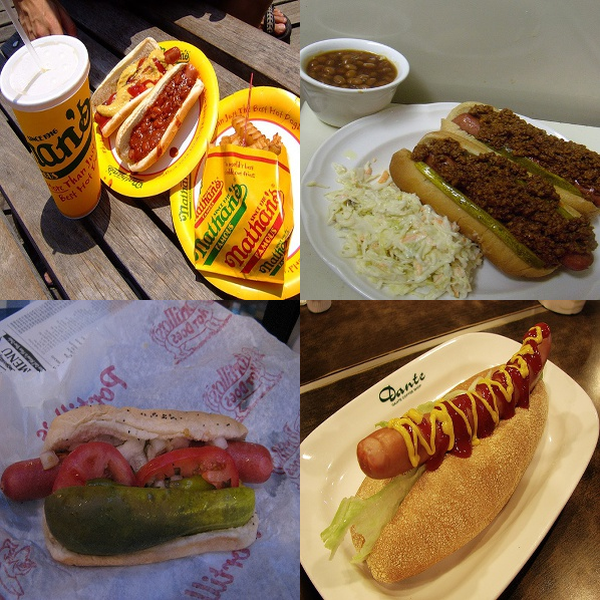

In [22]:
images = [
    Image.open(image).resize(
        (300, 300),
        Image.Resampling.LANCZOS
    )
    for image in sample(train_hotdog, 4)
]

image = grid(images)
display(image)

Training (Not Hotdog)

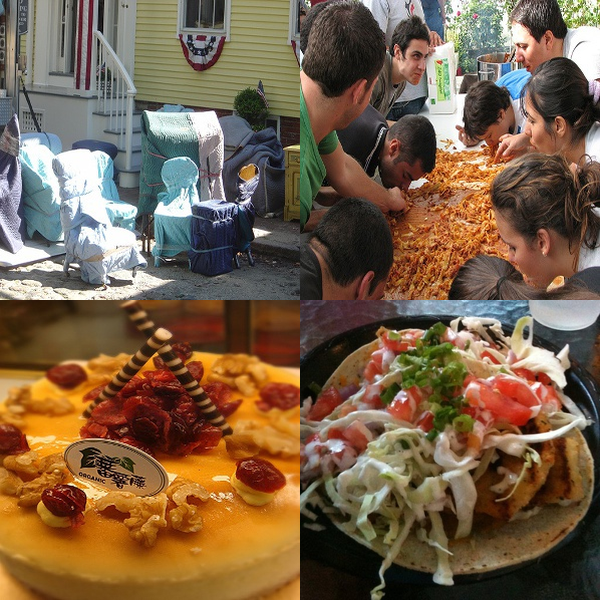

In [23]:
images = [
    Image.open(image).resize(
        (300, 300),
        Image.Resampling.LANCZOS
    )
    for image in sample(train_not_hotdog, 4)
]

image = grid(images)
display(image)

$$\text{\Huge{Data wrangling / preprocessing}}$$

In [24]:
# Model
shape = input_shape = (300, 300, 3)
image_size = target_size = (300, 300)
batch_size = 32
epochs = 40
label_mode = 'binary'

# Augmentation
horizontal_flip = True
rescale = (1.0 / 255)
rotation_range = 40
shear_range = 0.2
zoom_range = 0.2

class_mode = 'binary'
color_mode = 'rgb'

In [25]:
# training_generator = ImageDataGenerator(
#     horizontal_flip=horizontal_flip,
#     rescale=rescale,
#     rotation_range=rotation_range,
#     shear_range=shear_range,
#     zoom_range=zoom_range
# )

# training_data = training_generator.flow_from_directory(
#     train,
#     target_size=target_size,
#     batch_size=batch_size,
#     class_mode=class_mode
# )


training_data = image_dataset_from_directory(
    train,
    batch_size=batch_size,
    image_size=image_size,
    label_mode=label_mode
)

Found 3642 files belonging to 2 classes.


In [26]:
# testing_generator = ImageDataGenerator(
#     rescale=rescale,
# )

# testing_data = testing_generator.flow_from_directory(
#     test,
#     target_size=target_size,
#     batch_size=batch_size,
#     class_mode=class_mode
# )


testing_data = image_dataset_from_directory(
    test,
    batch_size=batch_size,
    image_size=image_size,
    label_mode=label_mode
)

Found 400 files belonging to 2 classes.


In [27]:
# validation_generator = ImageDataGenerator(
#     rescale=rescale,
# )

# validation_data = validation_generator.flow_from_directory(
#     validation,
#     target_size=target_size,
#     batch_size=batch_size,
#     class_mode=class_mode
# )


validation_data = image_dataset_from_directory(
    validation,
    batch_size=batch_size,
    image_size=image_size,
    label_mode=label_mode
)

Found 600 files belonging to 2 classes.


In [28]:
for db, lb in training_data:
    print(f"Data Batch Shape: {db.shape}")
    print(f"Label Batch Shape: {lb.shape}")

    break

Data Batch Shape: (32, 300, 300, 3)
Label Batch Shape: (32, 1)


In [29]:
augment = Sequential(
    [
        RandomFlip('horizontal'),
        RandomFlip('vertical'),
        RandomRotation(0.5),
        RandomZoom(0.5),
    ]
)

$$\text{\Huge{Build a model}}$$

$$\text{\LARGE{Dense Hyperparameter Tuning}}$$

In [30]:
def dense_hypermodel(hp):
    hypermodel = Sequential()

    # Input layer
    units = hp.Int(
        'units',
        min_value=16,
        max_value=64,
        step=16
    )

    activation = hp.Choice(
        'activation',
        ['relu']
    )

    hypermodel.add(
        Dense(
            activation=activation,
            units=units,
            input_shape=input_shape
        )
    )

    hypermodel.add(
        Flatten()
    )

    # Hidden layers
    layers = hp.Int('num_layers', 1, 4)

    for layer in range(layers):
        hypermodel.add(
            Dense(
                activation=activation,
                units=units,
            )
        )

    units = hp.Int(
        'units',
        min_value=32,
        max_value=128,
        step=32
    )

    layers = hp.Int('num_layers', 1, 4)

    for layer in range(layers):
        hypermodel.add(
            Dense(
                activation=activation,
                units=units
            )
        )

    # Output layer
    hypermodel.add(
        Dense(
            activation=Activation('sigmoid'),
            units=1
        )
    )

    learning_rate = hp.Choice(
        'learning_rate',
        values=[1e-2, 1e-3, 1e-4]
    )

    hypermodel.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss=BinaryCrossentropy(),
        metrics=['accuracy']
    )

    return hypermodel

In [31]:
dense_hypermodel(
    HyperParameters()
)

tuner = BayesianOptimization(
    hypermodel=dense_hypermodel,
    objective='val_accuracy',
    overwrite=True,
    directory='tuning/',
    project_name='dense_hyperparameter'
)

tuner.search_space_summary()

callbacks = [
    EarlyStopping(
        monitor='val_accuracy',
        patience=5
    ),
    ModelCheckpoint(
        filepath='model_dense_tuned.keras',
        monitor='val_loss',
        save_best_only=True
    )
]

tuner.search(
    training_data,
    callbacks=callbacks,
    epochs=20,
    validation_data=validation_data,
)

Trial 10 Complete [00h 00m 45s]
val_accuracy: 0.6116666793823242

Best val_accuracy So Far: 0.6766666769981384
Total elapsed time: 00h 11m 46s


In [32]:
hyperparameters = tuner.get_best_hyperparameters(num_trials=1)[0]

In [33]:
for k, v in hyperparameters.values.items():
    print(k, v)

units 48
activation relu
num_layers 3
learning_rate 0.001


In [34]:
model_dense_tuned = tuner.hypermodel.build(hyperparameters)

history_dense_tuned = model_dense_tuned.fit(
    training_data,
    epochs=20,
    validation_data=validation_data
)

per_epoch = history_dense_tuned.history['val_accuracy']

epochs = per_epoch.index(
    max(per_epoch)
) + 1

Epoch 1/20
114/114 [==============================] - 5s 42ms/step - loss: 403.7134 - accuracy: 0.5321 - val_loss: 50.7412 - val_accuracy: 0.5267
Epoch 2/20
114/114 [==============================] - 5s 41ms/step - loss: 44.4243 - accuracy: 0.5758 - val_loss: 45.2871 - val_accuracy: 0.5000
Epoch 3/20
114/114 [==============================] - 5s 41ms/step - loss: 36.7263 - accuracy: 0.5697 - val_loss: 8.1227 - val_accuracy: 0.6633
Epoch 4/20
114/114 [==============================] - 5s 41ms/step - loss: 18.0521 - accuracy: 0.5975 - val_loss: 8.1026 - val_accuracy: 0.5717
Epoch 5/20
114/114 [==============================] - 5s 41ms/step - loss: 6.4276 - accuracy: 0.6546 - val_loss: 13.7902 - val_accuracy: 0.5383
Epoch 6/20
114/114 [==============================] - 5s 41ms/step - loss: 6.3283 - accuracy: 0.6505 - val_loss: 13.8239 - val_accuracy: 0.5583
Epoch 7/20
114/114 [==============================] - 5s 41ms/step - loss: 2.5140 - accuracy: 0.7342 - val_loss: 2.5560 - val_accurac

In [35]:
model_dense_tuned = tuner.hypermodel.build(hyperparameters)

history_dense_tuned = model_dense_tuned.fit(
    training_data,
    callbacks=callbacks,
    epochs=epochs,
    validation_data=validation_data,
)

Epoch 1/14
114/114 [==============================] - 8s 65ms/step - loss: 571.4211 - accuracy: 0.5368 - val_loss: 56.8349 - val_accuracy: 0.6000
Epoch 2/14
114/114 [==============================] - 5s 43ms/step - loss: 71.3886 - accuracy: 0.5582 - val_loss: 93.9678 - val_accuracy: 0.4983
Epoch 3/14
114/114 [==============================] - 5s 41ms/step - loss: 32.8820 - accuracy: 0.5953 - val_loss: 78.3361 - val_accuracy: 0.5000
Epoch 4/14
114/114 [==============================] - 7s 64ms/step - loss: 23.4611 - accuracy: 0.6129 - val_loss: 9.8781 - val_accuracy: 0.6200
Epoch 5/14
114/114 [==============================] - 5s 42ms/step - loss: 8.4383 - accuracy: 0.6678 - val_loss: 10.6929 - val_accuracy: 0.5450
Epoch 6/14
114/114 [==============================] - 8s 65ms/step - loss: 7.3180 - accuracy: 0.6609 - val_loss: 6.1002 - val_accuracy: 0.6400
Epoch 7/14
114/114 [==============================] - 7s 65ms/step - loss: 3.0180 - accuracy: 0.7515 - val_loss: 5.6028 - val_accurac

In [36]:
loss, accuracy = model_dense_tuned.evaluate(training_data)
display_deep_score(loss, accuracy)

114/114 [==============================] - 3s 22ms/step - loss: 1.1697 - accuracy: 0.7776


Metric,Score
Loss,1.169673
Accuracy,0.777595


In [37]:
loss, accuracy = model_dense_tuned.evaluate(validation_data)
display_deep_score(loss, accuracy)

19/19 [==============================] - 1s 23ms/step - loss: 5.0752 - accuracy: 0.5700


Metric,Score
Loss,5.075199
Accuracy,0.570000


In [38]:
loss, accuracy = model_dense_tuned.evaluate(testing_data)
display_deep_score(loss, accuracy)

13/13 [==============================] - 0s 20ms/step - loss: 4.6048 - accuracy: 0.5600


Metric,Score
Loss,4.604826
Accuracy,0.560000


$$\text{\LARGE{CNN Hyperparameter Tuning}}$$

In [39]:
def cnn_hypermodel(hp):
    hypermodel = Sequential()

    # Input layer
    activation = hp.Choice(
        'activation',
        ['relu']
    )

    filters = hp.Int(
        'filters',
        min_value=16,
        max_value=64,
        step=16
    )

    kernel_size = hp.Choice(
        'kernel_size',
        values=[1, 3, 5, 7]
    )

    pool_size = hp.Choice(
        'pool_size',
        values=[2]
    )

    padding = hp.Choice(
        'padding',
        values=['same', 'valid']
    )

    hypermodel.add(
        Conv2D(
            activation=activation,
            filters=filters,
            input_shape=input_shape,
            kernel_size=kernel_size,
            padding=padding
        )
    )

    # Hidden layers
    layers = hp.Int('num_layers', 1, 4)

    for layer in range(layers):
        hypermodel.add(
            Conv2D(
                activation=activation,
                filters=filters,
                kernel_size=kernel_size,
                padding=padding,
            )
        )

        hypermodel.add(
            BatchNormalization()
        )

        hypermodel.add(
            Activation('relu')
        )

        hypermodel.add(
            MaxPooling2D(
                padding=padding,
                pool_size=pool_size
            )
        )

    hypermodel.add(
        Flatten()
    )

    units = hp.Int(
        'units',
        min_value=32,
        max_value=128,
        step=32
    )

    hypermodel.add(
        Dense(
            activation=activation,
            units=units
        )
    )

    hypermodel.add(
        BatchNormalization()
    )

    layers = hp.Int('num_layers', 1, 4)

    for layer in range(layers):
        hypermodel.add(
            Dense(
                activation=activation,
                units=units
            )
        )

    # Output layer
    hypermodel.add(
        Dense(
            activation=Activation('sigmoid'),
            units=1
        )
    )

    learning_rate = hp.Choice(
        'learning_rate',
        values=[1e-2, 1e-3, 1e-4]
    )

    hypermodel.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss=BinaryCrossentropy(),
        metrics=['accuracy']
    )

    return hypermodel

In [40]:
cnn_hypermodel(
    HyperParameters()
)

tuner = BayesianOptimization(
    hypermodel=cnn_hypermodel,
    objective='val_accuracy',
    overwrite=True,
    directory='tuning/',
    project_name='cnn_hyperparameter'
)

tuner.search_space_summary()

callbacks = [
    EarlyStopping(
        monitor='val_accuracy',
        patience=5
    ),
    ModelCheckpoint(
        filepath='model_cnn_tuned.keras',
        monitor='val_loss',
        save_best_only=True
    )
]

tuner.search(
    training_data,
    callbacks=callbacks,
    epochs=20,
    validation_data=validation_data,
)

Trial 10 Complete [00h 02m 29s]
val_accuracy: 0.6366666555404663

Best val_accuracy So Far: 0.7266666889190674
Total elapsed time: 00h 16m 40s


In [41]:
hyperparameters = tuner.get_best_hyperparameters(num_trials=1)[0]

In [42]:
for k, v in hyperparameters.values.items():
    print(k, v)

activation relu
filters 48
kernel_size 7
pool_size 2
padding same
num_layers 1
units 128
learning_rate 0.0001


In [43]:
model_cnn_tuned = tuner.hypermodel.build(hyperparameters)

history_cnn_tuned = model_cnn_tuned.fit(
    training_data,
    epochs=20,
    validation_data=validation_data
)

per_epoch = history_cnn_tuned.history['val_accuracy']

epochs = per_epoch.index(
    max(per_epoch)
) + 1

Epoch 1/20
114/114 [==============================] - 11s 92ms/step - loss: 0.6203 - accuracy: 0.6595 - val_loss: 2.2607 - val_accuracy: 0.5000
Epoch 2/20
114/114 [==============================] - 10s 92ms/step - loss: 0.3732 - accuracy: 0.8561 - val_loss: 0.8189 - val_accuracy: 0.5750
Epoch 3/20
114/114 [==============================] - 10s 91ms/step - loss: 0.1628 - accuracy: 0.9566 - val_loss: 0.6650 - val_accuracy: 0.5967
Epoch 4/20
114/114 [==============================] - 10s 92ms/step - loss: 0.0559 - accuracy: 0.9923 - val_loss: 0.6248 - val_accuracy: 0.6567
Epoch 5/20
114/114 [==============================] - 10s 92ms/step - loss: 0.0201 - accuracy: 0.9995 - val_loss: 0.5944 - val_accuracy: 0.7117
Epoch 6/20
114/114 [==============================] - 10s 91ms/step - loss: 0.0100 - accuracy: 0.9997 - val_loss: 0.6118 - val_accuracy: 0.7300
Epoch 7/20
114/114 [==============================] - 10s 91ms/step - loss: 0.0056 - accuracy: 1.0000 - val_loss: 0.6448 - val_accuracy:

In [44]:
model_cnn_tuned = tuner.hypermodel.build(hyperparameters)

history_cnn_tuned = model_cnn_tuned.fit(
    training_data,
    callbacks=callbacks,
    epochs=epochs,
    validation_data=validation_data,
)

Epoch 1/19
114/114 [==============================] - 12s 105ms/step - loss: 0.6468 - accuracy: 0.6370 - val_loss: 1.4499 - val_accuracy: 0.5233
Epoch 2/19
114/114 [==============================] - 12s 105ms/step - loss: 0.3563 - accuracy: 0.8641 - val_loss: 0.6172 - val_accuracy: 0.6750
Epoch 3/19
114/114 [==============================] - 10s 90ms/step - loss: 0.1716 - accuracy: 0.9519 - val_loss: 0.7499 - val_accuracy: 0.5467
Epoch 4/19
114/114 [==============================] - 10s 91ms/step - loss: 0.0715 - accuracy: 0.9920 - val_loss: 0.6264 - val_accuracy: 0.6567
Epoch 5/19
114/114 [==============================] - 10s 91ms/step - loss: 0.0277 - accuracy: 0.9986 - val_loss: 1.0682 - val_accuracy: 0.6017
Epoch 6/19
114/114 [==============================] - 10s 90ms/step - loss: 0.0139 - accuracy: 1.0000 - val_loss: 0.6740 - val_accuracy: 0.7267
Epoch 7/19
114/114 [==============================] - 10s 90ms/step - loss: 0.0101 - accuracy: 0.9997 - val_loss: 0.9336 - val_accurac

In [45]:
loss, accuracy = model_cnn_tuned.evaluate(training_data)
display_deep_score(loss, accuracy)

114/114 [==============================] - 3s 23ms/step - loss: 0.0028 - accuracy: 0.9997


Metric,Score
Loss,0.002796
Accuracy,0.999725


In [46]:
loss, accuracy = model_cnn_tuned.evaluate(validation_data)
display_deep_score(loss, accuracy)

19/19 [==============================] - 0s 21ms/step - loss: 0.7498 - accuracy: 0.7067


Metric,Score
Loss,0.749849
Accuracy,0.706667


In [47]:
loss, accuracy = model_cnn_tuned.evaluate(testing_data)
display_deep_score(loss, accuracy)

13/13 [==============================] - 0s 29ms/step - loss: 1.1235 - accuracy: 0.6150


Metric,Score
Loss,1.123488
Accuracy,0.615000


$$\text{\LARGE{Dense Model}}$$

In [48]:
inputs = Input(shape=shape)
x = augment(inputs)
x = Rescaling(1.0 / 255)(x)

x = Flatten()(x)

x = Dense(activation='relu', units=128)(x)
x = Dense(activation='relu', units=128)(x)
x = Dense(activation='relu', units=64)(x)
x = Dense(activation='relu', units=64)(x)
x = Dense(activation='relu', units=32)(x)
x = Dense(activation='relu', units=32)(x)

outputs = Dense(1, activation='sigmoid')(x)

In [49]:
model_dense = Model(inputs=inputs, outputs=outputs)

In [50]:
model_dense.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

In [51]:
callbacks = [
    EarlyStopping(
        monitor='val_accuracy',
        patience=5
    ),
    ModelCheckpoint(
        filepath='model_dense.keras',
        monitor='val_loss',
        save_best_only=True
    )
]

In [52]:
history_dense = model_dense.fit(
    training_data,
    epochs=epochs,
    callbacks=callbacks,
    validation_data=validation_data
)

Epoch 1/19
114/114 [==============================] - 10s 74ms/step - loss: 1.7761 - accuracy: 0.4945 - val_loss: 0.6787 - val_accuracy: 0.5500
Epoch 2/19
114/114 [==============================] - 8s 70ms/step - loss: 0.8652 - accuracy: 0.5200 - val_loss: 1.0706 - val_accuracy: 0.4983
Epoch 3/19
114/114 [==============================] - 9s 75ms/step - loss: 0.7367 - accuracy: 0.5423 - val_loss: 0.6738 - val_accuracy: 0.5700
Epoch 4/19
114/114 [==============================] - 8s 73ms/step - loss: 0.7723 - accuracy: 0.5351 - val_loss: 0.6962 - val_accuracy: 0.5000
Epoch 5/19
114/114 [==============================] - 8s 71ms/step - loss: 0.7031 - accuracy: 0.5524 - val_loss: 0.6944 - val_accuracy: 0.5217
Epoch 6/19
114/114 [==============================] - 9s 75ms/step - loss: 0.6926 - accuracy: 0.5615 - val_loss: 0.6728 - val_accuracy: 0.5900
Epoch 7/19
114/114 [==============================] - 9s 77ms/step - loss: 0.7297 - accuracy: 0.5535 - val_loss: 0.6564 - val_accuracy: 0.618

In [53]:
summary = model_dense.summary()
print(summary)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 300, 300, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 300, 300, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 300, 300, 3)       0         
                                                                 
 flatten_3 (Flatten)         (None, 270000)            0         
                                                                 
 dense_10 (Dense)            (None, 128)               34560128  
                                                                 
 dense_11 (Dense)            (None, 128)               16512     
                                                                 
 dense_12 (Dense)            (None, 64)                8256  

In [54]:
loss, accuracy = model_dense.evaluate(training_data)
display_deep_score(loss, accuracy)

114/114 [==============================] - 1s 12ms/step - loss: 0.6758 - accuracy: 0.6145


Metric,Score
Loss,0.675825
Accuracy,0.614498


In [55]:
loss, accuracy = model_dense.evaluate(testing_data)
display_deep_score(loss, accuracy)

13/13 [==============================] - 0s 9ms/step - loss: 0.6792 - accuracy: 0.5850


Metric,Score
Loss,0.679174
Accuracy,0.585000


In [56]:
loss, accuracy = model_dense.evaluate(validation_data)
display_deep_score(loss, accuracy)

19/19 [==============================] - 0s 18ms/step - loss: 0.6762 - accuracy: 0.5967


Metric,Score
Loss,0.676156
Accuracy,0.596667


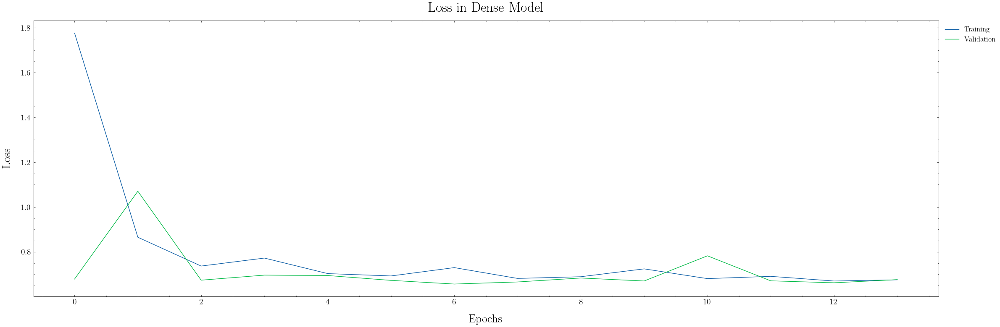

In [57]:
figsize = (24, 8)
fig, ax = plt.subplots(figsize=figsize)

plt.plot(history_dense.history['loss'], label='Training')
plt.plot(history_dense.history['val_loss'], label='Validation')

plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.title('Loss in Dense Model')

plt.legend(
    loc='upper left', 
    bbox_to_anchor=(1, 1)
)

plt.tight_layout()
plt.show()
plt.close()

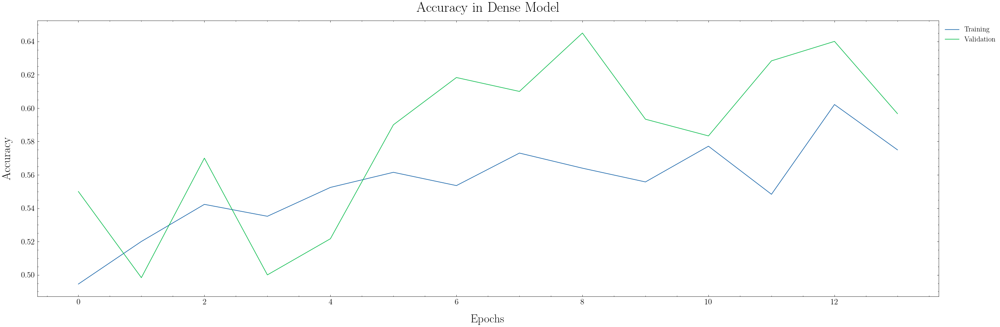

In [58]:
figsize = (24, 8)
fig, ax = plt.subplots(figsize=figsize)

plt.plot(history_dense.history['accuracy'], label='Training')
plt.plot(history_dense.history['val_accuracy'], label='Validation')

plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.title('Accuracy in Dense Model')

plt.legend(
    loc='upper left', 
    bbox_to_anchor=(1, 1)
)

plt.tight_layout()
plt.show()
plt.close()

$$\text{\LARGE{CNN Model}}$$

In [59]:
inputs = Input(shape=shape)
x = augment(inputs)
x = Rescaling(1.0 / 255)(x)

x = SeparableConv2D(filters=16, kernel_size=3, padding='same', use_bias=False)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D(pool_size=2, padding='same')(x)
x = Dropout(0.20)(x)

x = SeparableConv2D(filters=32, kernel_size=3, padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D(pool_size=2, padding='same')(x)
x = Dropout(0.25)(x)

x = SeparableConv2D(filters=64, kernel_size=3, padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D(pool_size=2, padding='same')(x)
x = Dropout(0.30)(x)

x = Flatten()(x)

x = Dense(activation='relu', units=32)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Dropout(0.50)(x)

outputs = Dense(1, activation='sigmoid')(x)

In [60]:
model_cnn = Model(inputs=inputs, outputs=outputs)

In [61]:
model_cnn.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

In [62]:
callbacks = [
    EarlyStopping(
        monitor='val_accuracy',
        patience=5
    ),
    ModelCheckpoint(
        filepath='model_cnn.keras',
        monitor='val_loss',
        save_best_only=True
    )
]

In [63]:
history_cnn = model_cnn.fit(
    training_data,
    epochs=epochs,
    callbacks=callbacks,
    validation_data=validation_data
)

Epoch 1/19
114/114 [==============================] - 16s 120ms/step - loss: 0.7269 - accuracy: 0.5868 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 2/19
114/114 [==============================] - 14s 120ms/step - loss: 0.6713 - accuracy: 0.6280 - val_loss: 0.6932 - val_accuracy: 0.4600
Epoch 3/19
114/114 [==============================] - 14s 120ms/step - loss: 0.6351 - accuracy: 0.6590 - val_loss: 0.6916 - val_accuracy: 0.5617
Epoch 4/19
114/114 [==============================] - 14s 122ms/step - loss: 0.6420 - accuracy: 0.6483 - val_loss: 0.6864 - val_accuracy: 0.5017
Epoch 5/19
114/114 [==============================] - 14s 119ms/step - loss: 0.6241 - accuracy: 0.6755 - val_loss: 0.6894 - val_accuracy: 0.5383
Epoch 6/19
114/114 [==============================] - 13s 118ms/step - loss: 0.6197 - accuracy: 0.6771 - val_loss: 0.6995 - val_accuracy: 0.6117
Epoch 7/19
114/114 [==============================] - 14s 119ms/step - loss: 0.6261 - accuracy: 0.6691 - val_loss: 0.6863 - val_ac

In [64]:
summary = model_cnn.summary()
print(summary)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 300, 300, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 300, 300, 3)       0         
                                                                 
 rescaling_1 (Rescaling)     (None, 300, 300, 3)       0         
                                                                 
 separable_conv2d (Separable  (None, 300, 300, 16)     75        
 Conv2D)                                                         
                                                                 
 batch_normalization_7 (Batc  (None, 300, 300, 16)     64        
 hNormalization)                                                 
                                                                 
 activation_7 (Activation)   (None, 300, 300, 16)      0   

In [65]:
loss, accuracy = model_cnn.evaluate(training_data)
display_deep_score(loss, accuracy)

114/114 [==============================] - 2s 13ms/step - loss: 0.6296 - accuracy: 0.7147


Metric,Score
Loss,0.629577
Accuracy,0.714717


In [66]:
loss, accuracy = model_cnn.evaluate(testing_data)
display_deep_score(loss, accuracy)

13/13 [==============================] - 0s 9ms/step - loss: 0.6706 - accuracy: 0.6225


Metric,Score
Loss,0.670643
Accuracy,0.622500


In [67]:
loss, accuracy = model_cnn.evaluate(validation_data)
display_deep_score(loss, accuracy)

19/19 [==============================] - 0s 12ms/step - loss: 0.6420 - accuracy: 0.6783


Metric,Score
Loss,0.642039
Accuracy,0.678333


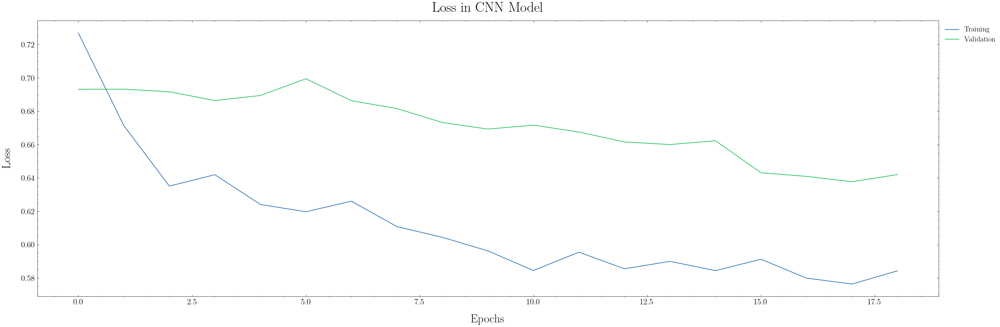

In [68]:
figsize = (24, 8)
fig, ax = plt.subplots(figsize=figsize)

plt.plot(history_cnn.history['loss'], label='Training')
plt.plot(history_cnn.history['val_loss'], label='Validation')

plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.title('Loss in CNN Model')

plt.legend(
    loc='upper left', 
    bbox_to_anchor=(1, 1)
)

plt.tight_layout()
plt.show()
plt.close()

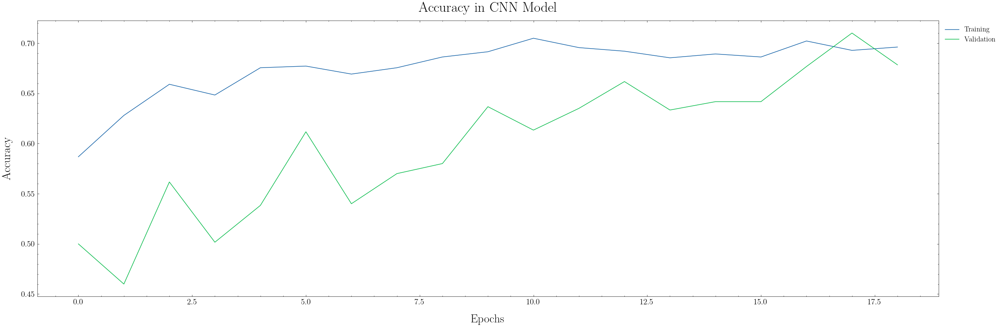

In [69]:
figsize = (24, 8)
fig, ax = plt.subplots(figsize=figsize)

plt.plot(history_cnn.history['accuracy'], label='Training')
plt.plot(history_cnn.history['val_accuracy'], label='Validation')

plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.title('Accuracy in CNN Model')

plt.legend(
    loc='upper left', 
    bbox_to_anchor=(1, 1)
)

plt.tight_layout()
plt.show()
plt.close()

- We attempted use hyperparameter tuning to find the best settings for our dense network and convolutional neural network
    - We found ourselves constrained by the lack of resources on Google Colab as well as on our local machines
    - On Google Colab, we ran out of disk space and RAM on the GPU due to hyperparameter tuning
        - Both of us were subsequently restricted from using Google Colab for more than 12 hours
    - We were unable to tune small(er) models, which gave us a baseline model to improve
        
<br>

- An ongoing theme for us during this project was a lack of resources. In an attempt to solve this problem, we...
    1. Tried to resize the images to a smaller size (i.e., 200x200, 180x180, 150x150)
    2. Changed the `batch_size`
        - A `batch_size` of 64 was often too big, and we were unable to increase it beyond that due to GPU limitations
        - A `batch_size` of 32 tended to work in most scenarios
    3. Modified the model architecture
        - We tried big and small architectures
            - Increased/decreased the amount of layers
            - Increased/decreased the amount of filters/units per layer
            - Modifying the keyword arguments such as `padding`
            - We incorporated augmentation, which helped reduce overfitting
                - We tried adding new parameters
                - We increased/decreased the amount we augmented the dataset

<br>

- In general, we found augmentation and `Dropout` helped fight overfitting
- Regardless of our model...
    - We hovered around:
        - 60-100% training accuracy
        - 60-70% validation accuracy
        - 50-67% testing accuracy
- Our best score came from incorporating the `ResNet152V2` pretrained model, which boosted our testing accuracy by a few percent
    - Our best convolutional neural network model peaked at 63-64% testing accuracy
    - Our best `ResNet152V2` pretrained model peaked at 67% testing accuracy
    
<br>
    
- Our theory for our low testing scores are:
    1. The image dataset itself
        - Some of the images of hotdogs are drowned in condiments or toppings that cover the entire hotdog
        - There was a lot of "*background noise*" in our images (i.e., people, objects, etc.) that were more in focus
        - Variable zoom - some images were far, some images were close
        - We had a relatively small dataset, which may have affected our model's ability
    2. The constraints and limitations
        - We were forced to keep our model(s) small due to GPU issues
        - We struggled to train our model(s) in a timely manner
            - For example, hyperparameter tuning would take 1-3 hours, depending on the parameters

<br>

- All in all, we were disappointed by the outcome.
    - We hoped for better scores, but were unable to obtain it
    - The silver lining was that the pretrained model didn't boost our accuracy *that* much
        - We assume it didn't train on too many hotdog images

**Why did you choose the types of layers you did?**

- We used `SeparableConv2D()` opposed to `Conv2D()` because it was proposed to compute faster than the traditional layer.
    - `SeparableConv2D()` is also noted as working better on an image dataset.
    - A `SeparableConv2D()` layer will perform a depthwise spatial convolution.
- We used `MaxPooling2D()` because it reduces overfitting and lowers computing costs by limiting the amount of parameters the model has to learn.
    - We didn't use a larger pool size, because using more than a 2x2 size would result in a loss of information. We have a small enough dataset as it is.
- We used `BatchNormalization()` to make our values similar, which would result in a mean of around 0 and standard deviation of 1.
- We used `Dropout()` to help with overfitting and help our model make better generalizations.

**Why did you choose the size of layers you did?**

- A large model would result in subpar training and validation accuracies
- In the event that a large(r) model performed well, then it wasn't worth the time to train it, because a smaller model would perform just as well, if not better.

**Why did you organize the layers the way you did?**

- We referred to the "*Architectural rules-of-thumb*" slide from the lecture, which served as our guide for organizing the layers.

**Why did you choose the output layer size and activation function that you did?**

- We chose to use `1` as the output layer size and `sigmoid` as the activation function due to the nature of our problem, which was a binary classification problem.

$$\text{\LARGE{Pretrained Model}}$$

In [70]:
rn152v2_shape = rn152v2_input_shape = (224, 224, 3)
rn152v2_image_size = rn152v2_target_size = (224, 224)

In [71]:
rn152v2_training_data = image_dataset_from_directory(
    train,
    batch_size=batch_size,
    image_size=rn152v2_image_size,
    label_mode=label_mode
)

Found 3642 files belonging to 2 classes.


In [72]:
rn152v2_testing_data = image_dataset_from_directory(
    test,
    batch_size=batch_size,
    image_size=rn152v2_image_size,
    label_mode=label_mode
)

Found 400 files belonging to 2 classes.


In [73]:
rn152v2_validation_data = image_dataset_from_directory(
    validation,
    batch_size=batch_size,
    image_size=rn152v2_image_size,
    label_mode=label_mode
)

Found 600 files belonging to 2 classes.


In [74]:
rn152v2 = ResNet152V2(
    weights='imagenet',
    include_top=False
)

In [75]:
rn152v2.trainable = False

In [76]:
inputs = Input(shape=rn152v2_shape)
x = augment(inputs)
x = Rescaling(1.0 / 255)(x)
x = preprocess_input(x)
x = rn152v2(x)

x = SeparableConv2D(filters=16, kernel_size=3, padding='same', use_bias=False)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D(pool_size=2, padding='same')(x)
x = Dropout(0.20)(x)

x = SeparableConv2D(filters=32, kernel_size=3, padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D(pool_size=2, padding='same')(x)
x = Dropout(0.25)(x)

x = SeparableConv2D(filters=64, kernel_size=3, padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D(pool_size=2, padding='same')(x)
x = Dropout(0.30)(x)

x = Flatten()(x)

x = Dense(activation='relu', units=128)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Dropout(0.50)(x)

outputs = Dense(1, activation='sigmoid')(x)

In [77]:
model_pretrained = Model(inputs=inputs, outputs=outputs)

In [78]:
model_pretrained.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

In [79]:
callbacks = [
    EarlyStopping(
        monitor='val_accuracy',
        patience=5
    ),
    ModelCheckpoint(
        filepath='model_pretrained.keras',
        monitor='val_loss',
        save_best_only=True
    )
]

In [80]:
history_pretrained = model_pretrained.fit(
    rn152v2_training_data,
    epochs=epochs,
    callbacks=callbacks,
    validation_data=rn152v2_validation_data
)

Epoch 1/19
114/114 [==============================] - 17s 101ms/step - loss: 0.8843 - accuracy: 0.5088 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 2/19
114/114 [==============================] - 11s 92ms/step - loss: 0.7957 - accuracy: 0.5137 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 3/19
114/114 [==============================] - 10s 90ms/step - loss: 0.7654 - accuracy: 0.5104 - val_loss: 0.6932 - val_accuracy: 0.5000
Epoch 4/19
114/114 [==============================] - 11s 93ms/step - loss: 0.7387 - accuracy: 0.5074 - val_loss: 0.6927 - val_accuracy: 0.4983
Epoch 5/19
114/114 [==============================] - 11s 92ms/step - loss: 0.7087 - accuracy: 0.5324 - val_loss: 0.6864 - val_accuracy: 0.5483
Epoch 6/19
114/114 [==============================] - 11s 95ms/step - loss: 0.7049 - accuracy: 0.5376 - val_loss: 0.6722 - val_accuracy: 0.6100
Epoch 7/19
114/114 [==============================] - 11s 94ms/step - loss: 0.6944 - accuracy: 0.5502 - val_loss: 0.6684 - val_accuracy

In [81]:
summary = model_pretrained.summary()
print(summary)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, None, None, 3)     0         
                                                                 
 rescaling_2 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 224, 224, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 resnet152v2 (Functional)    (None, None, None, 2048)  5833

In [82]:
loss, accuracy = model_pretrained.evaluate(rn152v2_training_data)
display_deep_score(loss, accuracy)

114/114 [==============================] - 4s 31ms/step - loss: 0.6223 - accuracy: 0.6469


Metric,Score
Loss,0.622254
Accuracy,0.646897


In [83]:
loss, accuracy = model_pretrained.evaluate(rn152v2_testing_data)
display_deep_score(loss, accuracy)

13/13 [==============================] - 0s 30ms/step - loss: 0.6090 - accuracy: 0.6325


Metric,Score
Loss,0.609019
Accuracy,0.632500


In [84]:
loss, accuracy = model_pretrained.evaluate(rn152v2_validation_data)
display_deep_score(loss, accuracy)

19/19 [==============================] - 1s 29ms/step - loss: 0.6190 - accuracy: 0.6683


Metric,Score
Loss,0.619000
Accuracy,0.668333


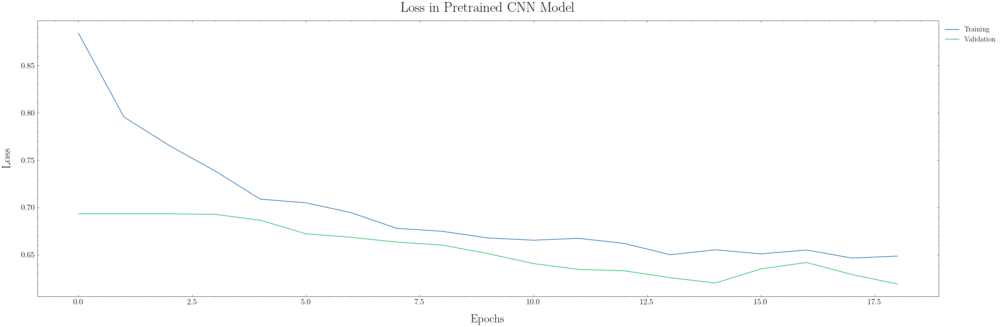

In [85]:
figsize = (24, 8)
fig, ax = plt.subplots(figsize=figsize)

plt.plot(history_pretrained.history['loss'], label='Training')
plt.plot(history_pretrained.history['val_loss'], label='Validation')

plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.title('Loss in Pretrained CNN Model')

plt.legend(
    loc='upper left', 
    bbox_to_anchor=(1, 1)
)

plt.tight_layout()
plt.show()
plt.close()

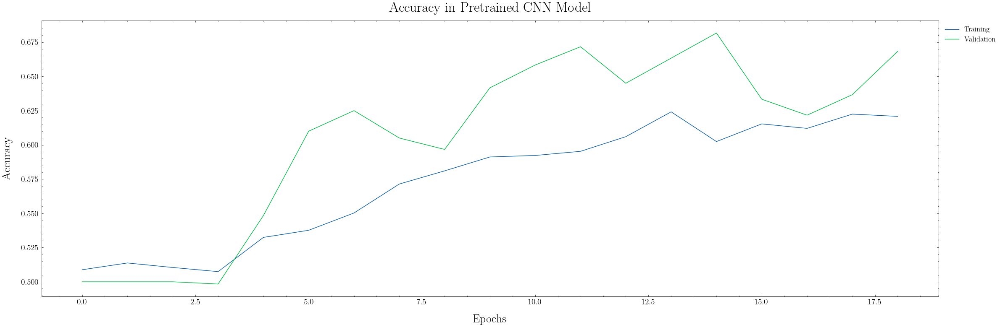

In [86]:
figsize = (24, 8)
fig, ax = plt.subplots(figsize=figsize)

plt.plot(history_pretrained.history['accuracy'], label='Training')
plt.plot(history_pretrained.history['val_accuracy'], label='Validation')

plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.title('Accuracy in Pretrained CNN Model')

plt.legend(
    loc='upper left', 
    bbox_to_anchor=(1, 1)
)

plt.tight_layout()
plt.show()
plt.close()

$$\text{\Huge{Model testing}}$$

Dense

In [87]:
loss, accuracy = model_dense.evaluate(testing_data)
display_deep_score(loss, accuracy)

13/13 [==============================] - 0s 8ms/step - loss: 0.6792 - accuracy: 0.5850


Metric,Score
Loss,0.679174
Accuracy,0.585000


CNN

In [88]:
loss, accuracy = model_cnn.evaluate(testing_data)
display_deep_score(loss, accuracy)

13/13 [==============================] - 0s 10ms/step - loss: 0.6706 - accuracy: 0.6225


Metric,Score
Loss,0.670643
Accuracy,0.622500


Pretrained

In [89]:
loss, accuracy = model_pretrained.evaluate(rn152v2_testing_data)
display_deep_score(loss, accuracy)

13/13 [==============================] - 0s 28ms/step - loss: 0.6090 - accuracy: 0.6325


Metric,Score
Loss,0.609023
Accuracy,0.632500


$$\text{\Huge{Model Visualization and Explainability}}$$

$$\text{\LARGE{Filters}}$$

Load our best convolutional neural network

In [90]:
model_best = load_model('model_cnn.keras')

Select each `SeparableConv2D` layer from our model, so we can analyze the filter(s) and activation map(s)

In [91]:
convolutional = [
    layer
    for layer in model_best.layers
    if isinstance(layer, SeparableConv2D)
]

for layer in convolutional:
    print(layer)

Plot the filters from our `SeparableConv2D` layer(s)

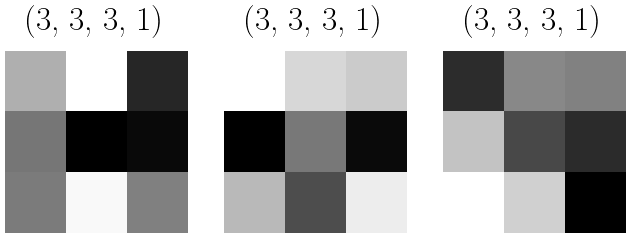

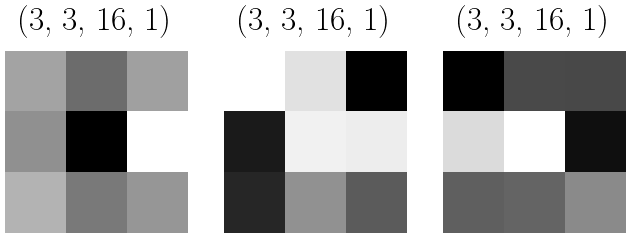

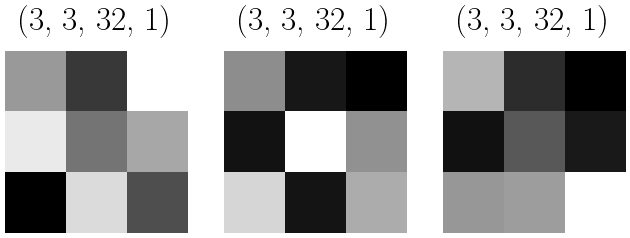

In [92]:
length = len(convolutional)
figsize = (8, 8)

for index, layer in enumerate(convolutional, 0):
    filters, *_ = layer.get_weights()
    f_min, f_max = filters.min(), filters.max()
    filters = (filters - f_min) / (f_max - f_min)

    *_, amount = filters.shape

    for i in range(amount):
        plt.figure(figsize=figsize)
        f = filters[:, :, :, i]

        for j, k in enumerate(range(length), 1):
            ax = plt.subplot(amount, 3, j)
            ax.set_title(filters.shape)

            plt.axis('off')

            plt.imshow(
                f[:, :, k],
                cmap='gray'
            )

    plt.show()
    plt.close()

$$\text{\LARGE{Feature Maps}}$$

Lets explore the feature maps of a random image from the internet

In [93]:
image = keras.utils.get_file(
    fname='hotdog.png',
    origin='https://upload.wikimedia.org/wikipedia/commons/b/b1/Hot_dog_with_mustard.png'
)

Resize and rescale the image to be passed to our model

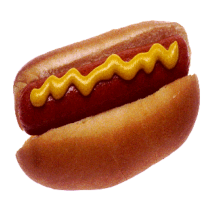

In [94]:
img = keras.utils.load_img(image, target_size=target_size)
array = keras.utils.img_to_array(img)
array = np.expand_dims(array, axis=0)

plt.axis('off')

plt.imshow(
    array[0].astype('uint8')
)

plt.show()

A showcase of the activation map(s) on the random image. Each layer is its own section, and the image is passed through from top to bottom and left to right

Convolutional Layer #1
1/1 [==============================] - 0s 37ms/step


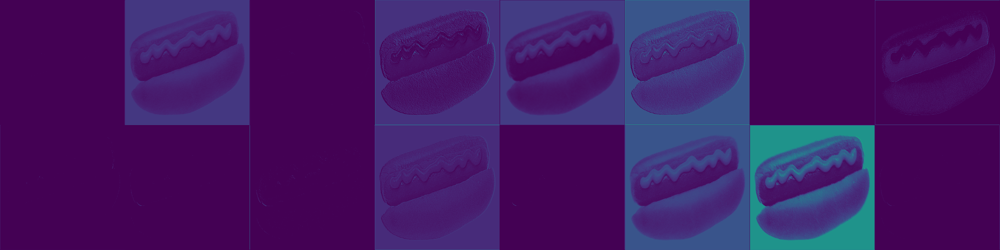



Convolutional Layer #2
1/1 [==============================] - 0s 32ms/step


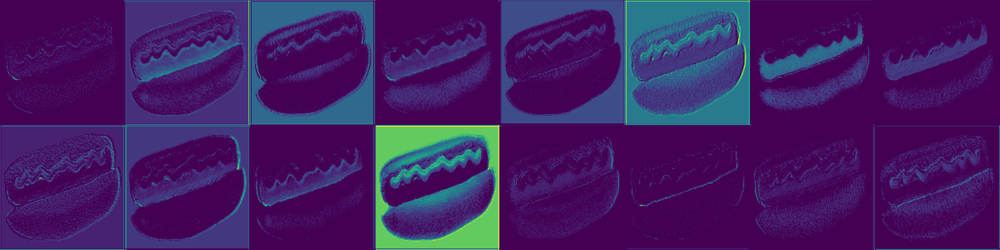



Convolutional Layer #3
1/1 [==============================] - 0s 40ms/step


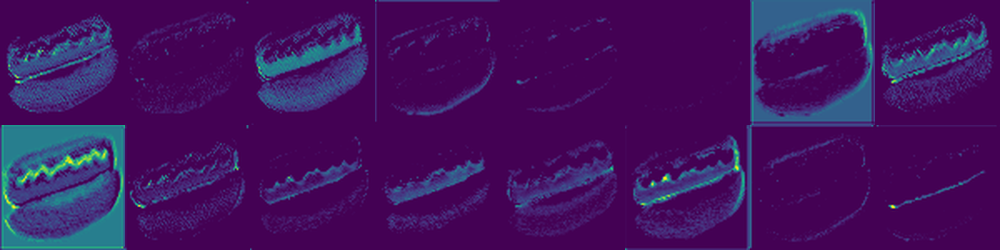

In [95]:
with warnings.catch_warnings():
    warnings.simplefilter('ignore')

inputs = model_best.inputs

for index, layer in enumerate(convolutional, 1):
    print(f"Convolutional Layer #{index}")

    image = get_activation(inputs)
    display(image)

    print('\n')

A sample of hotdog/not hotdog from our training dataset

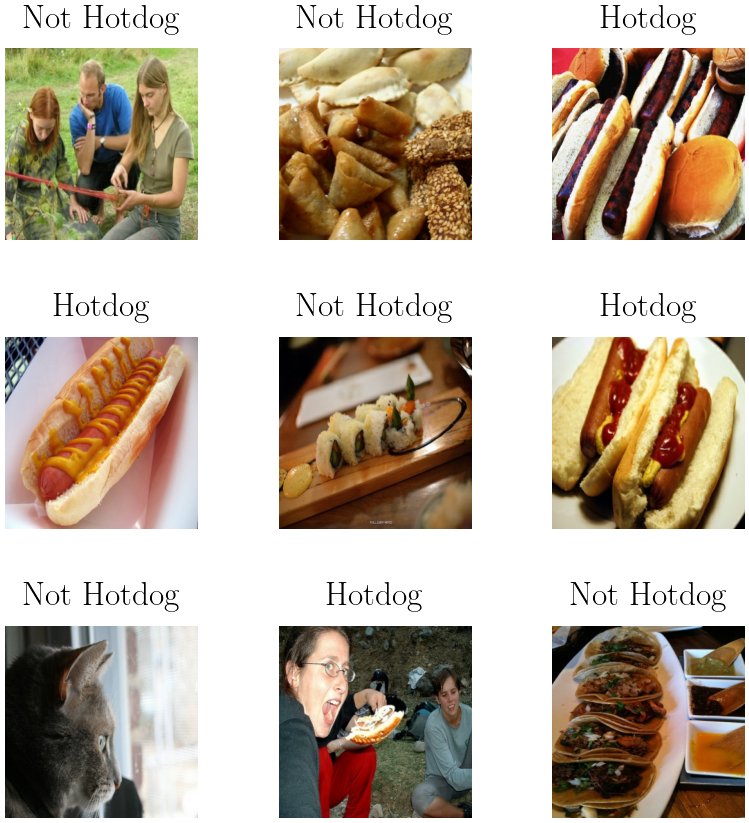

In [96]:
get_sample(training_data)

A sample of hotdog/not hotdog from our testing dataset

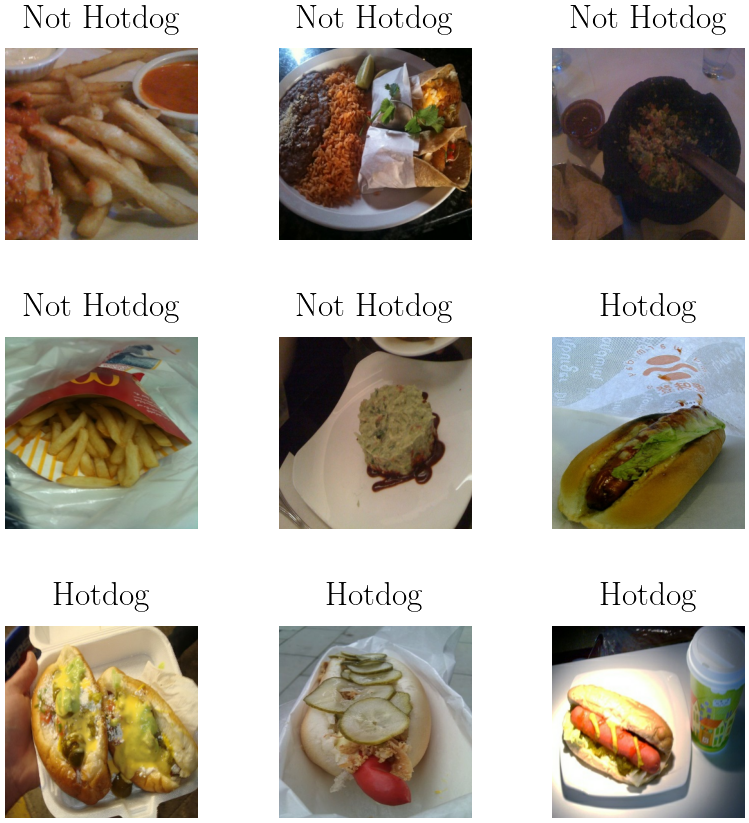

In [97]:
get_sample(testing_data)

A sample of hotdog/not hotdog from our validation dataset

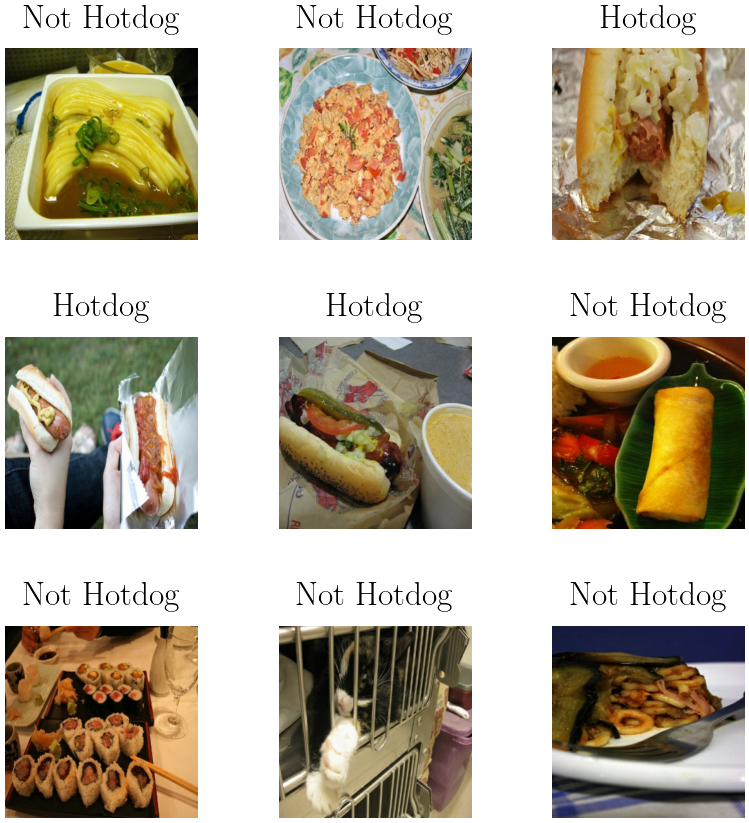

In [98]:
get_sample(validation_data)

Lets analyze how well our model was able to predict hotdog/not hotdog

1/1 [==============================] - 0s 64ms/step


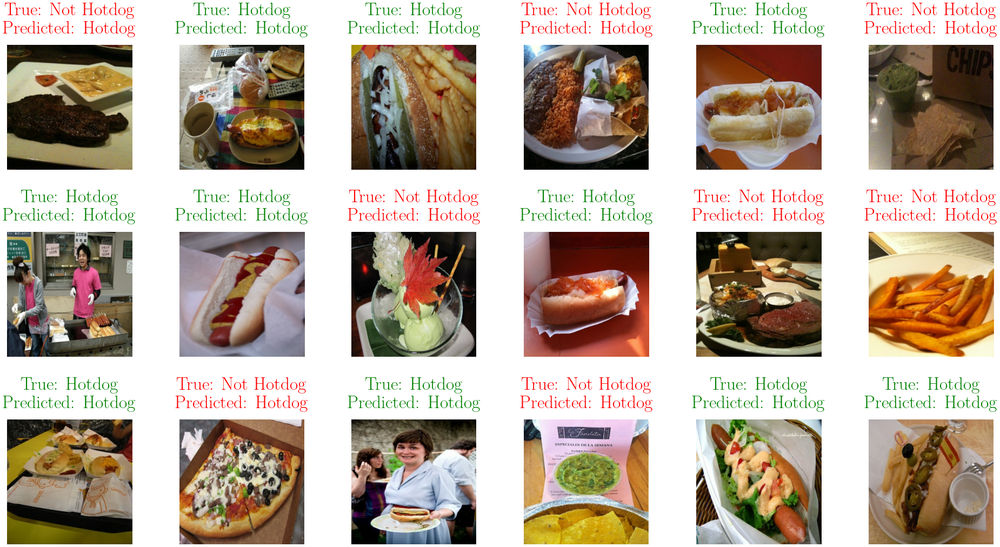

In [99]:
figsize = (24, 12)

classes = training_data.class_names

legend = {
    index: label.replace('_', ' ').title()
    for (index, label) in enumerate(classes, 0)
}

for images, labels in testing_data.take(1):
    prediction = model_best.predict(images)

    tli = np.argmax(labels, axis=-1)
    tpi = np.argmax(prediction, axis=-1)

    plt.figure(figsize=figsize)

    for i, j in enumerate(range(18), 1):
        plt.subplot(3, 6, i)
        plt.subplots_adjust(hspace=0.5)

        ti = images[j].numpy().astype('uint8')
        plt.imshow(ti)

        tl = int(labels[j])
        tl = legend.get(tl)

        tp = int(np.argmax(prediction[j]))
        tp = legend.get(tp)

        if tl == tp:
            color = 'green'
        else:
            color = 'red'

        plt.axis("off")
        
        title = f"True: {tl} \n Predicted: {tp}"
        plt.title(title, color=color)

    plt.show()
    plt.close()

$$\text{\Huge{Discussion}}$$

Compare the results of the dense and convolutional approach to model building.

**Does one model outperform the other?**

- Yes, it seems that the convolutional neural network model almost always performs better than the dense model.
    - We tried several architectures and hyperparameters, but were unable to produce a dense model that could consistently beat our convolutional neural network
    - When we used a pretrained model, it rivalled our convolutional neural network, and in some cases, it scored better than our convolutional neural network
- The next step we would want to take is looking at a pretrained model with a smaller model architecture to see if we're able to improve our scoring